<h1><center> Figure 1: raw betas (historical, ssp5 and differences) and intercepts as supplementary </center></h1>

In [30]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import xarray as xr
import pandas as pd
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from glob import glob
import subprocess
import seaborn as sns
import IPython.display as display
%matplotlib inline

import matplotlib.gridspec as gridspec
from matplotlib import ticker
from mpl_toolkits.axes_grid1 import make_axes_locatable

import os
from netCDF4 import Dataset as netcdf_dataset
from cartopy import config
from PIL import Image


In [4]:
#import data and create dictionary
# create a dictionary with the datasets
file_list_biovol = glob('/Users/mc4214/CMIP6_biome_PSS_data/*biovolume.nc')
file_list_biovol = [x for x in file_list_biovol if 'biovolume' in x]
file_list_biovol = [x for x in file_list_biovol if 'old' not in x]
file_list_biovol

['/Users/mc4214/CMIP6_biome_PSS_data/biom_CNRM_PSS_hist_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_CESM_PSS_ssp5_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_IPSL_PSS_hist_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_GFDL_PSS_hist_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_CNRM_PSS_ssp5_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_CESM_PSS_hist_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_GFDL_PSS_ssp5_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_IPSL_PSS_ssp5_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_UKESM_PSS_hist_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_GISS_PSS_ssp5_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_CMCC_PSS_ssp5_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_UKESM_PSS_ssp5_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_GISS_PSS_hist_biovolume.nc',
 '/Users/mc4214/CMIP6_biome_PSS_data/biom_CMCC_PSS_hist_biovolume.nc']

In [5]:


model_list = ['CESM', 'CMCC','CNRM','GFDL', 'GISS','IPSL','UKESM']
ds_dict = {}
ds_dict['hist'] = {}
ds_dict['ssp5'] = {}
for e in ['hist', 'ssp5']:
    for m in model_list:
        model_path = [x for x in file_list_biovol if e in x and m in x]
        ds_dict[e][m]= xr.open_mfdataset(model_path).mean(dim=['time'])
        #if m != 'GFDL':
        #ds_dict[m].reindex(lat=list(reversed(ds_dict[m].lat)))

In [6]:
for r, m in enumerate(model_list):
    print(m)
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(betas_ssp5=ds_dict['ssp5'][m].betas_ssp5)
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(betas_diff=ds_dict['ssp5'][m].betas_ssp5-ds_dict['hist'][m].betas_hist)
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(betas_per_diff=((ds_dict['ssp5'][m].betas_ssp5-ds_dict['hist'][m].betas_hist)/ds_dict['hist'][m].betas_hist)*100)
    
    #intercept_hist = ds_dict['hist'][m]['intercept_hist'].values
    #intercept_ssp5 = ds_dict['ssp5'][m]['intercept_ssp5'].values
    
    
    #ds_dict['hist'][m]['intercept_hist']= (('lat', 'lon'),10**(intercept_hist))
    #ds_dict['hist'][m]['intercept_ssp5']= (('lat', 'lon'),10**(intercept_ssp5))
    #ds_dict['ssp5'][m]['intercept_ssp5']= (('lat', 'lon'),10**(intercept_ssp5))

    ds_dict['hist'][m]=ds_dict['hist'][m].assign(intercept_ssp5=ds_dict['ssp5'][m].intercept_ssp5)    
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(intercept_diff=ds_dict['ssp5'][m].intercept_ssp5-ds_dict['hist'][m].intercept_hist)
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(intercept_per_diff=((ds_dict['ssp5'][m].intercept_ssp5-ds_dict['hist'][m].intercept_hist)/ds_dict['hist'][m].intercept_hist)*100)
    
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(total_biovolume_ssp5=ds_dict['ssp5'][m].total_biovolume_ssp5)    
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(total_biovolume_diff=ds_dict['ssp5'][m].total_biovolume_ssp5-ds_dict['hist'][m].total_biovolume_hist)
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(total_biovolume_per_diff=((ds_dict['ssp5'][m].total_biovolume_ssp5-ds_dict['hist'][m].total_biovolume_hist)/ds_dict['hist'][m].total_biovolume_hist)*100)
    
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(R2_ssp5=ds_dict['ssp5'][m].R2_ssp5)                                             
    ds_dict['hist'][m]=ds_dict['hist'][m].assign(R2_diff=ds_dict['ssp5'][m].intercept_ssp5-ds_dict['hist'][m].intercept_hist)
    
    #ds_dict['hist'][m] = ds_dict['hist'][m].assign_coords(lat=(ds_dict['hist'][m].lat * -1))


#ds_dict['COBALT'] = ds_dict['COBALT'].assign_coords(lat=(ds_dict['UKESM'].lat))
#ds_dict['hist']['GFDL'] = ds_dict['hist']['GFDL'].assign_coords(lon=(ds_dict['hist']['GFDL'].lon + 180))
#ds_dict['hist']['GFDL'] = ds_dict['hist']['GFDL'].assign_coords(lat=(ds_dict['hist']['GFDL'].lat * -1))

CESM
CMCC
CNRM
GFDL
GISS
IPSL
UKESM


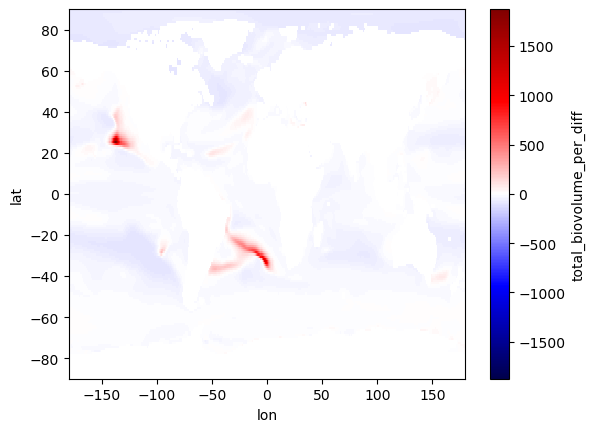

In [7]:
ds_dict['hist']['GISS'].total_biovolume_per_diff.plot(cmap='seismic')

In [8]:
np.nanmax(ds_dict['hist']['GISS'].intercept_hist)- np.nanmax(ds_dict['ssp5']['GISS'].intercept_ssp5)

-6.299836816242526e+20

In [9]:
np.nanmax(ds_dict['hist']['GISS'].intercept_hist)

2.6439124921083514e+20

In [10]:
np.nanmax(ds_dict['ssp5']['GISS'].intercept_ssp5)

8.943749308350878e+20

In [11]:
ds_dict['hist']['GFDL']

<xarray.Dataset>
Dimensions:                            (lat: 180, lon: 360, biovol_um3: 50)
Coordinates:
  * lat                                (lat) float64 -89.5 -88.5 ... 88.5 89.5
  * lon                                (lon) float64 -179.5 -178.5 ... 179.5
  * biovol_um3                         (biovol_um3) float64 0.09575 ... 3.104...
Data variables: (12/34)
    biomes                             (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    chl                                (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    NB                                 (biovol_um3, lat, lon) float64 dask.array<chunksize=(50, 180, 360), meta=np.ndarray>
    total_biovolume_hist_not_standard  (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    betas_hist                         (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    intercept_hist                     (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    ...                                 ...
    intercept_per_diff                 (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    total_biovolume_ssp5               (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    total_biovolume_diff               (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    total_biovolume_per_diff           (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    R2_ssp5                            (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>
    R2_diff                            (lat, lon) float64 dask.array<chunksize=(180, 360), meta=np.ndarray>

In [12]:
import tabulate

In [13]:
data_mean = [['Model', 'simulation', 'Slope', 'Intercept', 'Biovolume','Determination_Coefficient'],
             
        ['CESM','','','','',''],
             ['','historical', str(np.round(np.nanmean(ds_dict['hist']['CESM'].betas_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].betas_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].betas_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CESM'].intercept_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].intercept_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].intercept_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CESM'].total_biovolume_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].total_biovolume_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].total_biovolume_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CESM'].R2_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].R2_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].R2_hist.values),3))+')',],
             
             ['','ssp5',str(np.round(np.nanmean(ds_dict['hist']['CESM'].betas_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].betas_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].betas_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CESM'].intercept_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].intercept_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].intercept_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CESM'].total_biovolume_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].total_biovolume_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].total_biovolume_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CESM'].R2_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CESM'].R2_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CESM'].R2_ssp5.values),3))+')',],
             
         ['CMCC','','','','',''],
             ['','historical', str(np.round(np.nanmean(ds_dict['hist']['CMCC'].betas_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].betas_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].betas_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CMCC'].intercept_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].intercept_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].intercept_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CMCC'].total_biovolume_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].total_biovolume_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].total_biovolume_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CMCC'].R2_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].R2_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].R2_hist.values),3))+')',],
             
             ['','ssp5',str(np.round(np.nanmean(ds_dict['hist']['CMCC'].betas_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].betas_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].betas_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CMCC'].intercept_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].intercept_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].intercept_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CMCC'].total_biovolume_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].total_biovolume_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].total_biovolume_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CMCC'].R2_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CMCC'].R2_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CMCC'].R2_ssp5.values),3))+')',],

         ['CNRM','','','','',''],
             ['','historical', str(np.round(np.nanmean(ds_dict['hist']['CNRM'].betas_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].betas_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].betas_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CNRM'].intercept_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].intercept_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].intercept_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CNRM'].total_biovolume_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].total_biovolume_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].total_biovolume_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CNRM'].R2_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].R2_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].R2_hist.values),3))+')',],
             
             ['','ssp5',str(np.round(np.nanmean(ds_dict['hist']['CNRM'].betas_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].betas_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].betas_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CNRM'].intercept_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].intercept_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].intercept_ssp5.values),3))+')',    
                               str(np.round(np.nanmean(ds_dict['hist']['CNRM'].total_biovolume_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].total_biovolume_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].total_biovolume_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['CNRM'].R2_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['CNRM'].R2_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['CNRM'].R2_ssp5.values),3))+')',],
             
         ['GFDL','','','','',''],
            ['','historical', str(np.round(np.nanmean(ds_dict['hist']['GFDL'].betas_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].betas_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].betas_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GFDL'].intercept_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].intercept_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].intercept_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GFDL'].total_biovolume_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].total_biovolume_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].total_biovolume_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GFDL'].R2_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].R2_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].R2_hist.values),3))+')',],
             
             ['','ssp5',str(np.round(np.nanmean(ds_dict['hist']['GFDL'].betas_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].betas_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].betas_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GFDL'].intercept_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].intercept_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].intercept_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GFDL'].total_biovolume_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].total_biovolume_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].total_biovolume_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GFDL'].R2_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GFDL'].R2_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GFDL'].R2_ssp5.values),3))+')',],
             
         ['GISS','','','','',''],
             ['','historical', str(np.round(np.nanmean(ds_dict['hist']['GISS'].betas_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].betas_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].betas_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GISS'].intercept_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].intercept_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].intercept_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GISS'].total_biovolume_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].total_biovolume_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].total_biovolume_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GISS'].R2_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].R2_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].R2_hist.values),3))+')',],
             
             ['','ssp5',str(np.round(np.nanmean(ds_dict['hist']['GISS'].betas_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].betas_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].betas_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GISS'].intercept_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].intercept_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].intercept_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GISS'].total_biovolume_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].total_biovolume_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].total_biovolume_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['GISS'].R2_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['GISS'].R2_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['GISS'].R2_ssp5.values),3))+')',],
             
         ['IPSL','','','','',''],
             ['','historical', str(np.round(np.nanmean(ds_dict['hist']['IPSL'].betas_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].betas_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].betas_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['IPSL'].intercept_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].intercept_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].intercept_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['IPSL'].total_biovolume_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].total_biovolume_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].total_biovolume_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['IPSL'].R2_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].R2_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].R2_hist.values),3))+')',],
             
             ['','ssp5',str(np.round(np.nanmean(ds_dict['hist']['IPSL'].betas_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].betas_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].betas_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['IPSL'].intercept_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].intercept_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].intercept_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['IPSL'].total_biovolume_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].total_biovolume_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].total_biovolume_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['IPSL'].R2_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['IPSL'].R2_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['IPSL'].R2_ssp5.values),3))+')',],
              
         ['UKESM','','','','',''],
             ['','historical', str(np.round(np.nanmean(ds_dict['hist']['UKESM'].betas_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].betas_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].betas_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['UKESM'].intercept_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].intercept_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].intercept_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['UKESM'].total_biovolume_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].total_biovolume_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].total_biovolume_hist.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['UKESM'].R2_hist.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].R2_hist.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].R2_hist.values),3))+')',],
             
             ['','ssp5',str(np.round(np.nanmean(ds_dict['hist']['UKESM'].betas_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].betas_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].betas_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['UKESM'].intercept_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].intercept_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].intercept_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['UKESM'].total_biovolume_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].total_biovolume_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].total_biovolume_ssp5.values),3))+')',
                               str(np.round(np.nanmean(ds_dict['hist']['UKESM'].R2_ssp5.values),3)) +' ('+str(np.round(np.nanmin(ds_dict['hist']['UKESM'].R2_ssp5.values),3))+', '+str(np.round(np.nanmax(ds_dict['hist']['UKESM'].R2_ssp5.values),3))+')',]]
table = tabulate.tabulate(data_mean, tablefmt='csv')
text_file=open("NBSS_means_table.csv","w")
text_file.write(table)
text_file.close()

In [12]:
pwd()


'/work5/m1c/CMIP6_size_spectra_scripts'

In [14]:
letters = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.','k.','l.','m.','n.','o.','p.','q.','r.','s.','t.' ,'u.']

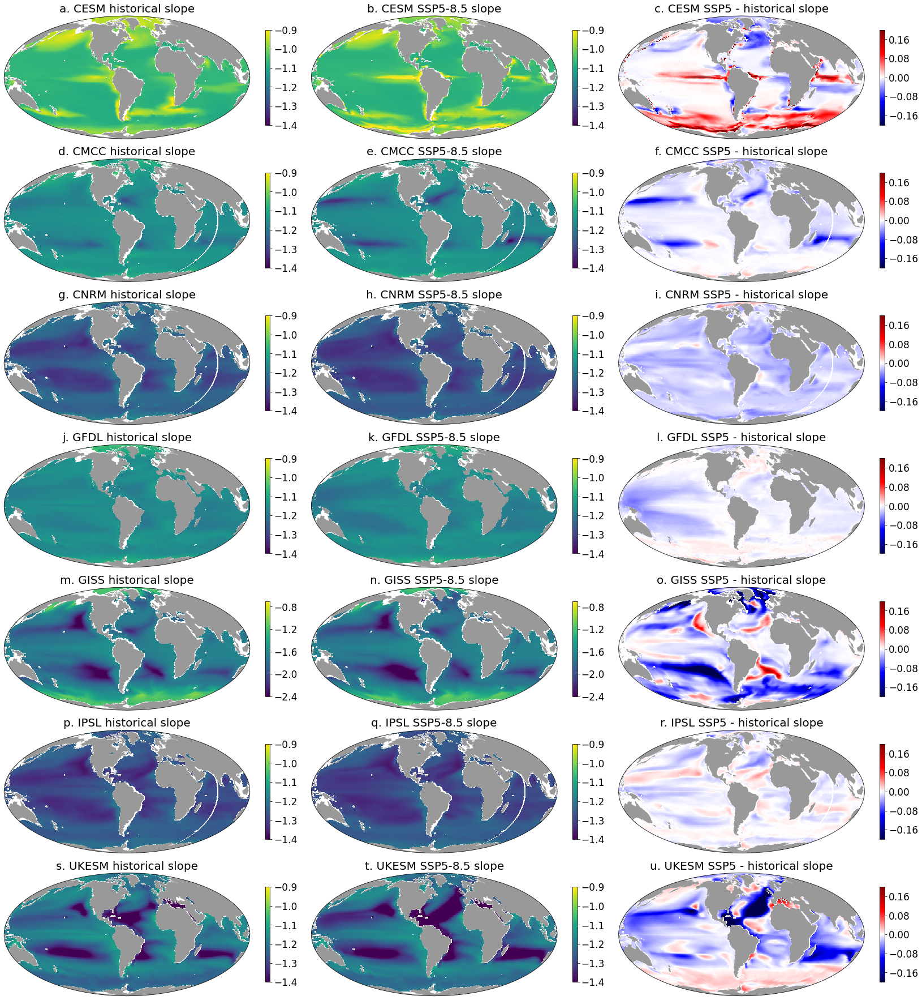

In [13]:
# create the 7x3 grid of subplots using gridspec
fig = plt.figure(figsize=(23,33))
gs = gridspec.GridSpec(nrows=7, ncols=3, figure=fig)
m=0
# plot the data on the subplots
axs = [None]*21
cs = [None]*21
for i in range(21):
    axs[i] = plt.subplot(gs[i],projection=ccrs.Mollweide(central_longitude=300))
    axs[i].add_feature(cfeature.LAND,  facecolor='#999999')
    v_min=-1.4
    v_max=-0.9
    #if model_list[m] == 'CESM':
        #v_max=-0.95
        #v_min=-1.1
    #if model_list[m] == 'CMCC':
        #v_max=-1.1
        #v_min=-1.2
    #if model_list[m] == 'CNRM':
        #v_max=-1.2
        #v_min=-1.3
    #if model_list[m] == 'GFDL':
        #v_max=-1.1
        #v_min=-1.2
    if model_list[m] == 'GISS':
        v_max=-0.7
        v_min=-2.4
    #if model_list[m] == 'IPSL':
        #v_max=-1.2
        #v_min=-1.3
    #if model_list[m] == 'UKESM':
        #v_max=-1.1
        #v_min=-1.3
    if i % 3 == 0:
        cs[i]=ds_dict['hist'][model_list[m]]['betas_hist'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=v_min, vmax=v_max, cmap='viridis', add_colorbar=False) #, add_colorbar=False , cbar_kwargs={'shrink': 0.3,  "spacing": "proportional"}
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' historical slope'), fontsize=20)

    elif i % 3 == 1:
        cs[i]=ds_dict['hist'][model_list[m]]['betas_ssp5'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=v_min, vmax=v_max, cmap='viridis', add_colorbar=False)
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' SSP5-8.5 slope'), fontsize=20)

    else:
        cs[i]=ds_dict['hist'][model_list[m]]['betas_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=-0.2, vmax=0.2, cmap='seismic', add_colorbar=False)
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' SSP5 - historical slope'), fontsize=20)

        m+=1

    #divider = make_axes_locatable(cs[i])
    #cax = divider.append_axes("right", size="5%", pad=0.05)
    bar = plt.colorbar(cs[i], shrink = 0.2)
    tick_locator = ticker.MaxNLocator(nbins=5)
    bar.locator = tick_locator
    bar.update_ticks()
    for t in bar.ax.get_yticklabels():
        t.set_fontsize(17)
    #if i ==11:
        #bar.set_label(r'Slope ( m$^{-2}$ $\mu$m$^{-3}$)', fontsize=25, rotation=-90,  labelpad=25)
    
    
plt.tight_layout()
fig.subplots_adjust(wspace=0, hspace=-0.7)
plt.savefig('/work/m1c/CMIP6_size_spectra_scripts/plots/fig_slopes_maps_biovolume.pdf', dpi=300)

In [14]:
import matplotlib.ticker as ticker
def fmt(x, pos):
    a, b = '{:.0e}'.format(x).split('e')
    b = int(b)
    return r'${} \times 10^{{{}}}$'.format(a, b)

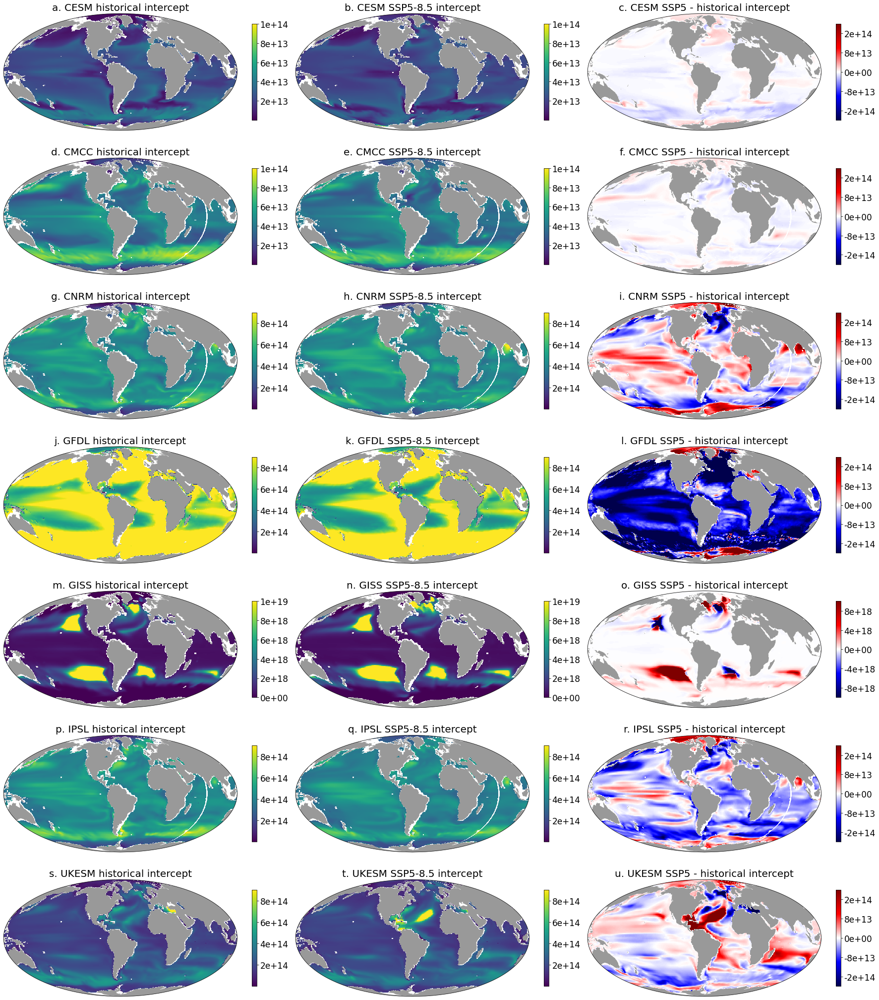

In [15]:
# create the 7x3 grid of subplots using gridspec
fig = plt.figure(figsize=(25,38))
gs = gridspec.GridSpec(nrows=7, ncols=3, figure=fig)
m=0
# plot the data on the subplots
axs = [None]*21
cs = [None]*21
for i in range(21):
    axs[i] = plt.subplot(gs[i],projection=ccrs.Mollweide(central_longitude=300))
    axs[i].add_feature(cfeature.LAND,  facecolor='#999999')
    v_max=9e14
    v_min=1e5
    if model_list[m] == 'CESM' or model_list[m] == 'CMCC':
        v_max=1e14
        v_min=1e5
    #if model_list[m] == 'CMCC':
        #v_max=8e13
        #v_min=1e13
    #if model_list[m] == 'CNRM':
        #v_max=8e14
        #v_min=1e14
    #if model_list[m] == 'GFDL':
        #v_max=3e15
        #v_min=1e14
        #v_max_diff=1e15
        #v_min_diff=-1e15
    if model_list[m] == 'GISS':
        v_max=1e19
        v_min=1e7
        v_max_diff=1e19
        v_min_diff=-1e19
    #if model_list[m] == 'IPSL':
        #v_max=8e14
        #v_min=1e14
    #if model_list[m] == 'UKESM':
        #v_max=6e14
        #v_min=1e14
        #v_max_diff=1e14
        #v_min_diff=-1e14
    if i % 3 == 0:
        cs[i]=ds_dict['hist'][model_list[m]]['intercept_hist'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=v_min, vmax=v_max, cmap='viridis', add_colorbar=False) #, add_colorbar=False , cbar_kwargs={'shrink': 0.3,  "spacing": "proportional"}
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' historical intercept'), fontsize=20)

    elif i % 3 == 1:
        cs[i]=ds_dict['hist'][model_list[m]]['intercept_ssp5'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=v_min, vmax=v_max, cmap='viridis', add_colorbar=False)
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' SSP5-8.5 intercept'), fontsize=20)


        #
    else:
        if model_list[m]== 'GISS':
            cs[i]=ds_dict['hist'][model_list[m]]['intercept_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(),vmin=v_min_diff, vmax=v_max_diff, cmap='seismic', add_colorbar=False)
        else:
            cs[i]=ds_dict['hist'][model_list[m]]['intercept_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=-2e14, vmax=2e14, cmap='seismic', add_colorbar=False)
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' SSP5 - historical intercept'), fontsize=20)

        m+=1

    #divider = make_axes_locatable(cs[i])
    #cax = divider.append_axes("right", size="5%", pad=0.05)
    bar = plt.colorbar(cs[i], shrink = 0.2, format='%.e')#, format=ticker.FuncFormatter(fmt)
    tick_locator = ticker.MaxNLocator(nbins=5)
    bar.locator = tick_locator
    bar.update_ticks()
    #bar.ax.set_yticklabels(["$10^{{{:.0f}}}$".format(i) for i in bar.get_ticks()])
    for t in bar.ax.get_yticklabels():
        t.set_fontsize(17)
    #if i ==11:
        #bar.set_label(r'Intercept ($\mu$m$^{3}$ m$^{-2}$ $\mu$m$^{-3}$', fontsize=25, rotation=-90, labelpad=27)
    
    
plt.tight_layout()
fig.subplots_adjust(wspace=0, hspace=-0.7)
plt.savefig('/work/m1c/CMIP6_size_spectra_scripts/plots/fig_intercept_maps_biovolume.pdf', dpi=300)

In [24]:
ds_dict['hist']['CMCC']['total_biovolume_hist'] = \
    ds_dict['hist']['CMCC']['total_biovolume_hist'].where(
        ds_dict['hist']['CMCC']['total_biovolume_hist'] != 0, np.nan)

ds_dict['hist']['CMCC']['total_biovolume_ssp5'] = \
    ds_dict['hist']['CMCC']['total_biovolume_ssp5'].where(
        ds_dict['hist']['CMCC']['total_biovolume_ssp5'] != 0, np.nan)

ds_dict['hist']['CMCC']['total_biovolume_diff'] = \
    ds_dict['hist']['CMCC']['total_biovolume_diff'].where(
        ds_dict['hist']['CMCC']['total_biovolume_diff'] != 0, np.nan)

In [25]:
ds_dict['hist']['GFDL']['total_biovolume_hist'] = \
    ds_dict['hist']['GFDL']['total_biovolume_hist'].where(
        ds_dict['hist']['GFDL']['total_biovolume_hist'] != 0, np.nan)

ds_dict['hist']['GFDL']['total_biovolume_ssp5'] = \
    ds_dict['hist']['GFDL']['total_biovolume_ssp5'].where(
        ds_dict['hist']['GFDL']['total_biovolume_ssp5'] != 0, np.nan)

ds_dict['hist']['GFDL']['total_biovolume_diff'] = \
    ds_dict['hist']['GFDL']['total_biovolume_diff'].where(
        ds_dict['hist']['GFDL']['total_biovolume_diff'] != 0, np.nan)


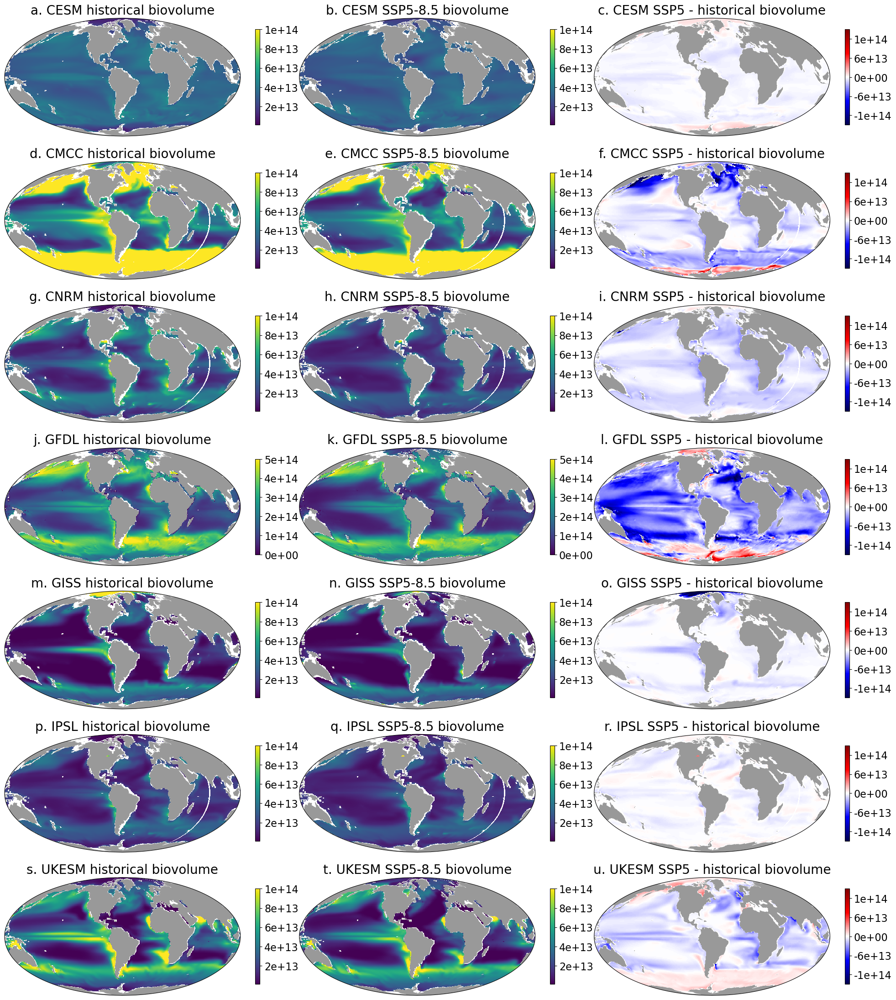

In [26]:
# create the 7x3 grid of subplots using gridspec
fig = plt.figure(figsize=(25,38))
gs = gridspec.GridSpec(nrows=7, ncols=3, figure=fig)
m=0
# plot the data on the subplots
axs = [None]*21
cs = [None]*21
for i in range(21):
    axs[i] = plt.subplot(gs[i],projection=ccrs.Mollweide(central_longitude=300))
    axs[i].add_feature(cfeature.LAND,  facecolor='#999999')
    if model_list[m] == 'GFDL':
        v_max=5e14
        v_min=1e2
    else:
        v_max=1e14
        v_min=1e12
    #if model_list[m] == 'CESM':
        
        #else:
            #v_max=4e13#10e13
            #v_min=1e13#5e13
    #if model_list[m] == 'CMCC':
        #v_max=20e13
        #v_min=1.5e12
    #if model_list[m] == 'CNRM':
        #v_max=5e13
        #v_min=8e12
    #if model_list[m] == 'GFDL':
        #v_max=10e14
        #v_min=15e13
    #if model_list[m] == 'GISS':
        #v_max=5e13
        #v_min=0.05e12
    #if model_list[m] == 'IPSL':
        #v_max=5e13
        #v_min=3e12
    #if model_list[m] == 'UKESM':
        #v_max=10e13
        #v_min=1e13
   
    if i % 3 == 0:
        cs[i]=ds_dict['hist'][model_list[m]]['total_biovolume_hist'].plot.imshow(ax=axs[i], origin = 'lower',vmin=v_min, vmax=v_max, transform=ccrs.PlateCarree(),  cmap='viridis', add_colorbar=False) #, add_colorbar=False , cbar_kwargs={'shrink': 0.3,  "spacing": "proportional"}
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' historical biovolume'), fontsize=20)

    elif i % 3 == 1:
        cs[i]=ds_dict['hist'][model_list[m]]['total_biovolume_ssp5'].plot.imshow(ax=axs[i], origin = 'lower',vmin=v_min, vmax=v_max, transform=ccrs.PlateCarree(),  cmap='viridis', add_colorbar=False)
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' SSP5-8.5 biovolume'), fontsize=20)

    else:
        cs[i]=ds_dict['hist'][model_list[m]]['total_biovolume_diff'].plot.imshow(ax=axs[i], origin = 'lower',vmin=-15e13, vmax=15e13, transform=ccrs.PlateCarree(),  cmap='seismic', add_colorbar=False)
        axs[i].set_title((letters[i]+' '+model_list[m]+ ' SSP5 - historical biovolume'), fontsize=20)

        m+=1

    #divider = make_axes_locatable(cs[i])
    #cax = divider.append_axes("right", size="5%", pad=0.05)
    bar = plt.colorbar(cs[i], shrink = 0.2, format='%.e')
    tick_locator = ticker.MaxNLocator(nbins=5)
    bar.locator = tick_locator
    bar.update_ticks()
    for t in bar.ax.get_yticklabels():
        t.set_fontsize(16)
    #if i ==11:
        #bar.set_label(r'Biovolume ($\mu$m$^{3}$ m$^{-2}$)', fontsize=25, rotation=-90, labelpad=27)
    
    
#plt.tight_layout()
fig.subplots_adjust(wspace=0, hspace=-0.7)
plt.savefig('/Users/mc4214/GIT/CMIP6_size_spectra/figures/fig_total_biovolume_maps_biovolume_116-2000.pdf', dpi=300)

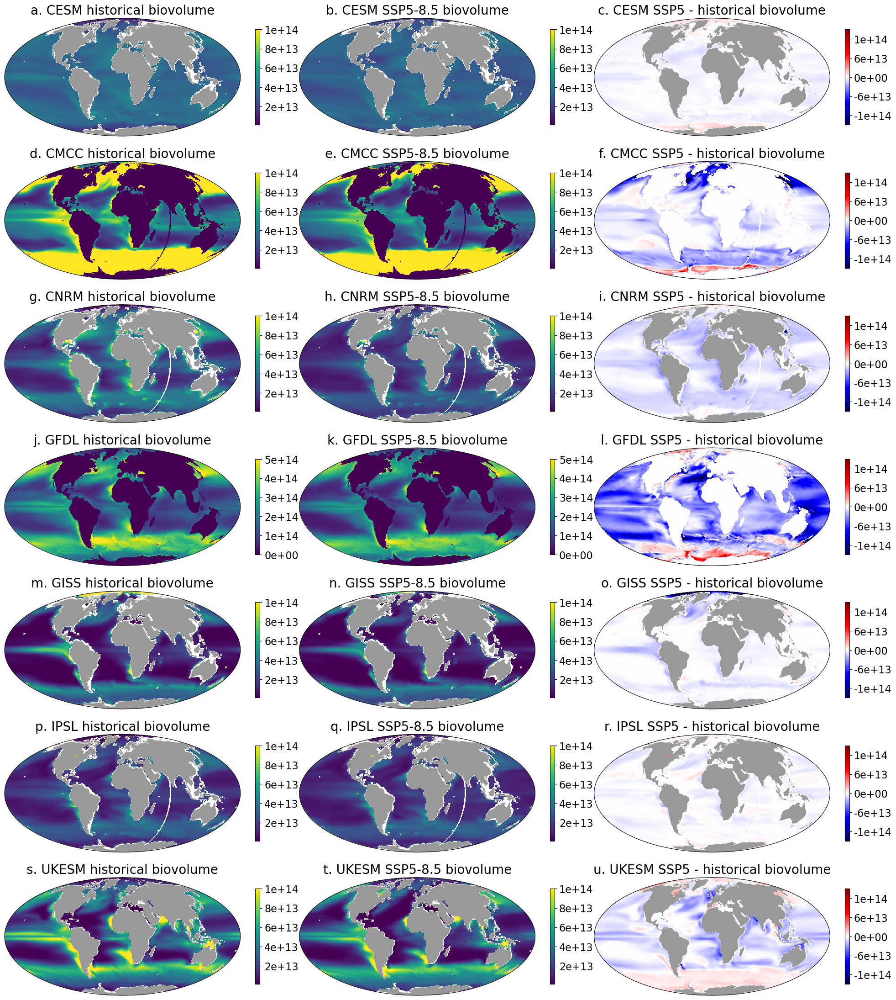

In [18]:
fig = plt.figure(figsize=(25,38))
gs = gridspec.GridSpec(nrows=7, ncols=3, figure=fig)

m = 0
axs = [None]*21
cs  = [None]*21

for i in range(21):
    # create subplot and store it
    axs[i] = fig.add_subplot(gs[i], projection=ccrs.Mollweide())
    ax = axs[i]  # convenience
    ax.set_global()
    ax.add_feature(cfeature.LAND.with_scale("110m"), facecolor="#999999")

    if model_list[m] == 'GFDL':
        v_max, v_min = 5e14, 1e2
    else:
        v_max, v_min = 1e14, 1e12

    if i % 3 == 0:
        cs[i] = ds_dict['hist'][model_list[m]]['total_biovolume_hist'].plot.imshow(
            ax=ax, origin='lower', vmin=v_min, vmax=v_max,
            transform=ccrs.PlateCarree(), cmap='viridis', add_colorbar=False
        )
        ax.set_title(f"{letters[i]} {model_list[m]} historical biovolume", fontsize=20)

    elif i % 3 == 1:
        cs[i] = ds_dict['hist'][model_list[m]]['total_biovolume_ssp5'].plot.imshow(
            ax=ax, origin='lower', vmin=v_min, vmax=v_max,
            transform=ccrs.PlateCarree(), cmap='viridis', add_colorbar=False
        )
        ax.set_title(f"{letters[i]} {model_list[m]} SSP5-8.5 biovolume", fontsize=20)

    else:
        cs[i] = ds_dict['hist'][model_list[m]]['total_biovolume_diff'].plot.imshow(
            ax=ax, origin='lower', vmin=-15e13, vmax=15e13,
            transform=ccrs.PlateCarree(), cmap='seismic', add_colorbar=False
        )
        ax.set_title(f"{letters[i]} {model_list[m]} SSP5 - historical biovolume", fontsize=20)
        m += 1  # advance model after each 3rd panel

    # safer to anchor colorbar to the right axes:
    bar = fig.colorbar(cs[i], ax=ax, shrink=0.2, format='%.e')
    bar.locator = ticker.MaxNLocator(nbins=5)
    bar.update_ticks()
    for t in bar.ax.get_yticklabels():
        t.set_fontsize(16)

fig.subplots_adjust(wspace=0, hspace=-0.7)
plt.savefig('/Users/mc4214/GIT/CMIP6_size_spectra/figures/fig_total_biovolume_maps_biovolume_116-2000.pdf', dpi=300)


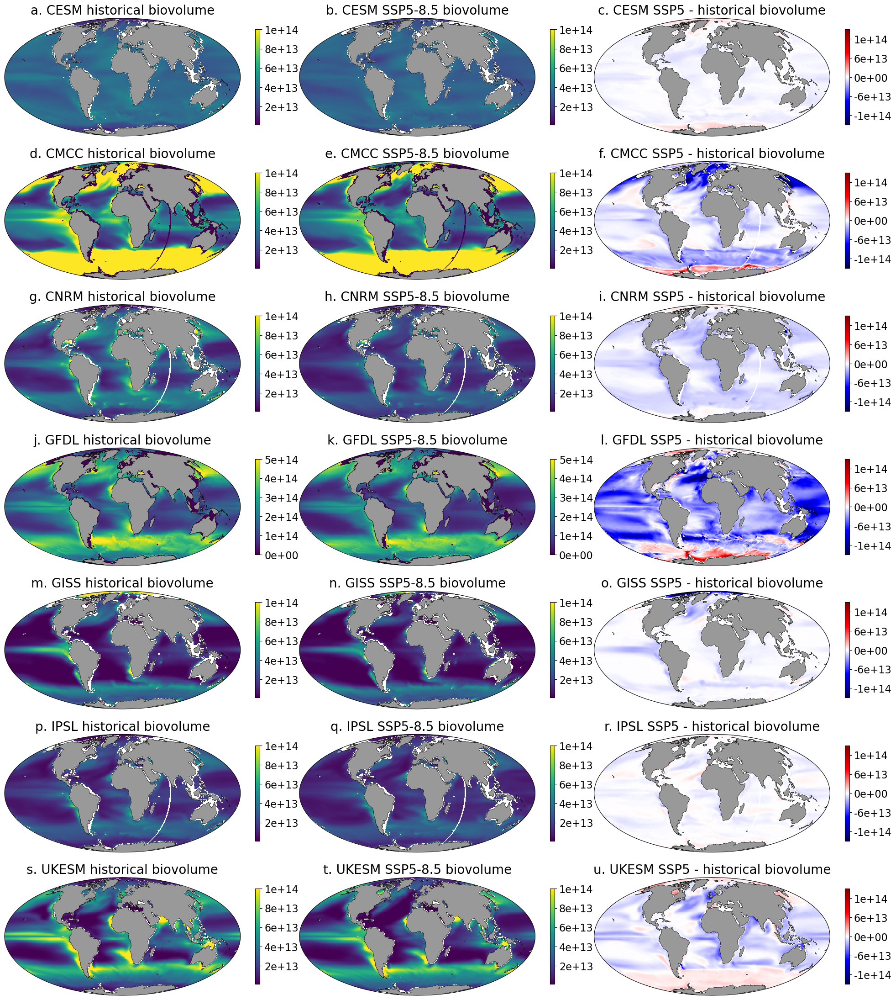

In [19]:
land_110 = cfeature.LAND.with_scale("110m")

fig = plt.figure(figsize=(25, 38))
gs = gridspec.GridSpec(nrows=7, ncols=3, figure=fig)

m = 0
for i in range(21):
    ax = fig.add_subplot(gs[i], projection=ccrs.Mollweide())  # or central_longitude=300
    ax.set_global()

    # choose limits
    v_max, v_min = (5e14, 1e2) if model_list[m] == "GFDL" else (1e14, 1e12)

    # pick the field for this panel
    if i % 3 == 0:
        field = ds_dict["hist"][model_list[m]]["total_biovolume_hist"]
        title = f"{letters[i]} {model_list[m]} historical biovolume"
    elif i % 3 == 1:
        field = ds_dict["hist"][model_list[m]]["total_biovolume_ssp5"]
        title = f"{letters[i]} {model_list[m]} SSP5-8.5 biovolume"
    else:
        field = ds_dict["hist"][model_list[m]]["total_biovolume_diff"]
        title = f"{letters[i]} {model_list[m]} SSP5 - historical biovolume"
        m += 1

    # draw the raster FIRST (low zorder)
    im = field.plot.imshow(
        ax=ax, origin="lower",
        vmin=v_min if i % 3 != 2 else -15e13,
        vmax=v_max if i % 3 != 2 else  15e13,
        transform=ccrs.PlateCarree(),
        cmap="viridis" if i % 3 != 2 else "seismic",
        add_colorbar=False,
        zorder=0,
    )

    # NOW draw land/coastlines ON TOP
    ax.add_feature(land_110, facecolor="#999999", edgecolor="black", linewidth=0.3, zorder=5)
    ax.coastlines("110m", linewidth=0.3, zorder=6)

    ax.set_title(title, fontsize=20)

    # colorbar tied to this axes
    cb = fig.colorbar(im, ax=ax, shrink=0.2, format="%.e")
    cb.locator = ticker.MaxNLocator(nbins=5)
    cb.update_ticks()
    for t in cb.ax.get_yticklabels():
        t.set_fontsize(16)

fig.subplots_adjust(wspace=0, hspace=-0.7)
plt.savefig("/Users/mc4214/GIT/CMIP6_size_spectra/figures/fig_total_biovolume_maps_biovolume_116-2000.pdf", dpi=300)


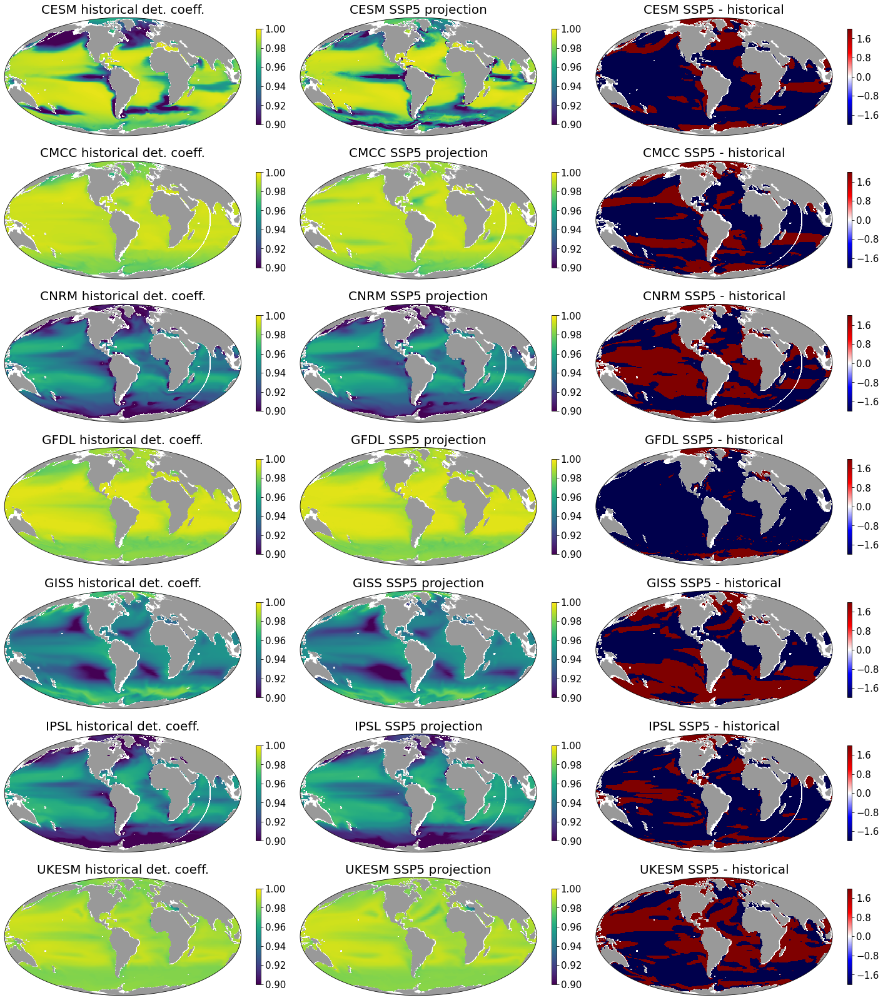

In [17]:
# create the 7x3 grid of subplots using gridspec
fig = plt.figure(figsize=(20,30))
gs = gridspec.GridSpec(nrows=7, ncols=3, figure=fig)
models = list(ds_dict.keys())
m=0

# plot the data on the subplots
axs = [None]*21
cs = [None]*21
for i in range(21):
    axs[i] = plt.subplot(gs[i],projection=ccrs.Mollweide(central_longitude=300))
    axs[i].add_feature(cartopy.feature.LAND,  facecolor='#999999')
    #v_min = np.nanmin(ds_dict[models[m]].intercept_ssp5.values)
    #v_max = np.nanmax(ds_dict[models[m]].intercept_ssp5.values)
    v_min=0.9
    v_max=1
    
    if i % 3 == 0:
        cs[i]=ds_dict['hist'][model_list[m]]['R2_hist'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=v_min, vmax=v_max, cmap='viridis', add_colorbar=False) #, add_colorbar=False
        axs[i].set_title((model_list[m]+ ' historical det. coeff.'), fontsize=20)
        #bar = plt.colorbar(cs[i])
        #bar.remove()
    elif i % 3 == 1:
        cs[i]=ds_dict['hist'][model_list[m]]['R2_ssp5'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=v_min, vmax=v_max, cmap='viridis', add_colorbar=False)
        axs[i].set_title((model_list[m]+ ' SSP5 projection'), fontsize=20)
    else:
        cs[i]=ds_dict['hist'][model_list[m]]['R2_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=-2, vmax=2, cmap='seismic', add_colorbar=False)
        axs[i].set_title((model_list[m]+ ' SSP5 - historical'), fontsize=20)
        m+=1
    bar = plt.colorbar(cs[i], shrink = 0.2)
    tick_locator = ticker.MaxNLocator(nbins=5)
    bar.locator = tick_locator
    bar.update_ticks()
    for t in bar.ax.get_yticklabels():
        t.set_fontsize(15)
    
    
plt.tight_layout()
fig.subplots_adjust(wspace=0, hspace=-0.7)
plt.savefig('/work/m1c/CMIP6_size_spectra_scripts/plots/fig_R2_maps_biovolume.pdf', dpi=300)

In [27]:
ds_dict['hist']['CMCC']['total_biovolume_per_diff'] = \
    ds_dict['hist']['CMCC']['total_biovolume_per_diff'].where(
        ds_dict['hist']['CMCC']['total_biovolume_per_diff'] != 0, np.nan)

In [28]:
ds_dict['hist']['GFDL']['total_biovolume_per_diff'] = \
    ds_dict['hist']['GFDL']['total_biovolume_per_diff'].where(
        ds_dict['hist']['GFDL']['total_biovolume_per_diff'] != 0, np.nan)


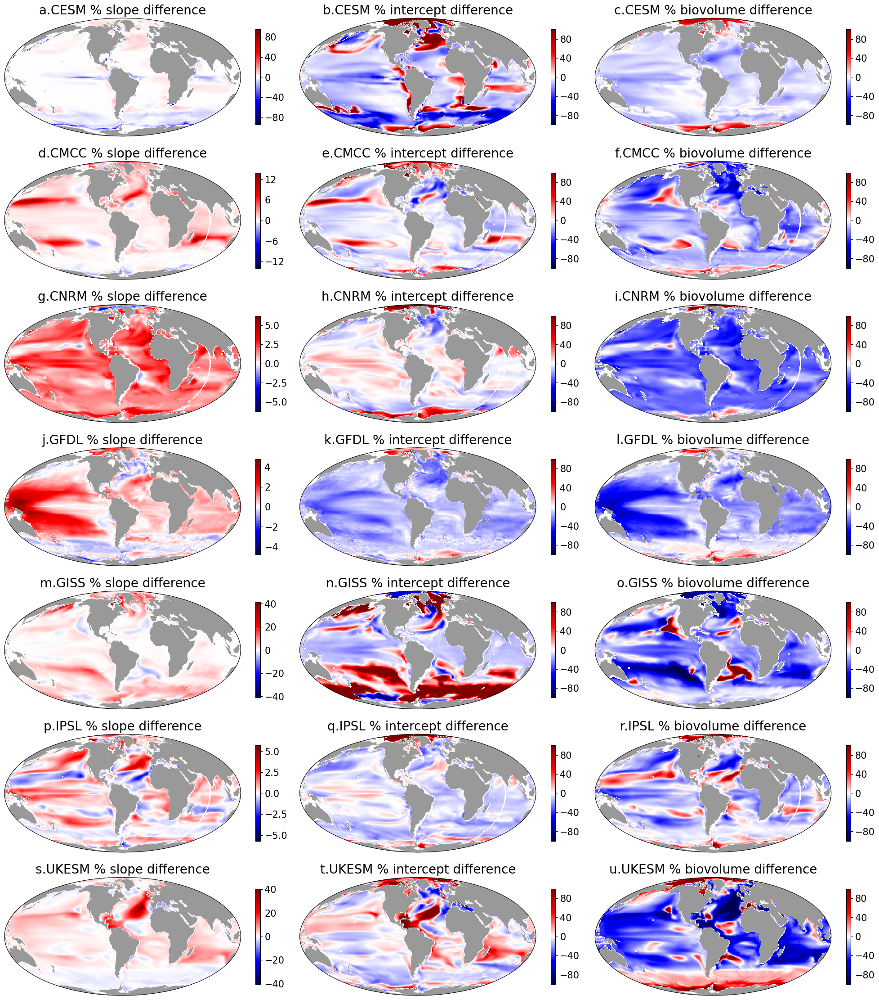

In [29]:
# create the 7x3 grid of subplots using gridspec
fig = plt.figure(figsize=(20,30))
gs = gridspec.GridSpec(nrows=7, ncols=3, figure=fig)
models = list(ds_dict.keys())
m=0


# plot the data on the subplots
axs = [None]*21
cs = [None]*21
for i in range(21):
    axs[i] = plt.subplot(gs[i],projection=ccrs.Mollweide(central_longitude=300))
    axs[i].add_feature(cartopy.feature.LAND,  facecolor='#999999')
    #v_min = np.nanmin(ds_dict[models[m]].intercept_ssp5.values)
    #v_max = np.nanmax(ds_dict[models[m]].intercept_ssp5.values)

    #v_min=0.9
    #v_max=1
    
    if i % 3 == 0:
        cs[i]=ds_dict['hist'][model_list[m]]['betas_per_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), cmap='seismic', add_colorbar=False) #, add_colorbar=False
        axs[i].set_title((letters[i]+ model_list[m]+ ' % slope difference'), fontsize=20)
        #bar = plt.colorbar(cs[i])
        #bar.remove()

    elif i % 3 == 1:
        if model_list[m] == 'BLUP':
            cs[i]=ds_dict['hist'][model_list[m]]['intercept_per_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=-100, vmax=100,  cmap='seismic', add_colorbar=False)
            axs[i].set_title((letters[i]+model_list[m]+ ' % intercept difference'), fontsize=20)
        else:
            cs[i]=ds_dict['hist'][model_list[m]]['intercept_per_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=-100, vmax=100, cmap='seismic', add_colorbar=False)
            axs[i].set_title((letters[i]+model_list[m]+ ' % intercept difference'), fontsize=20)

    else:
        cs[i]=ds_dict['hist'][model_list[m]]['total_biovolume_per_diff'].plot.imshow(ax=axs[i], origin = 'lower', transform=ccrs.PlateCarree(), vmin=-100, vmax=100,  cmap='seismic', add_colorbar=False)
        axs[i].set_title((letters[i]+model_list[m]+ ' % biovolume difference'), fontsize=20)

        m+=1
    bar = plt.colorbar(cs[i], shrink = 0.2)
    tick_locator = ticker.MaxNLocator(nbins=5)
    bar.locator = tick_locator
    bar.update_ticks()

    for t in bar.ax.get_yticklabels():
        t.set_fontsize(15)
    
    
plt.tight_layout()
fig.subplots_adjust(wspace=0, hspace=-0.7)
plt.savefig('/Users/mc4214/GIT/CMIP6_size_spectra/figures/fig_per_diff_maps_biovolume_166-2000.png', dpi=300)

In [ ]:
## PSSDB map

In [31]:
PSSdb_1a_files = glob('/Users/mc4214/Documents/CMIP6_PSS_paper/data/PSSdb_data/*1a*.csv')
PSSdb_1a_files = [x for x in PSSdb_1a_files if 'IFCB' not in x]
df_1a=pd.concat(map((lambda path: (pd.read_csv(path))), PSSdb_1a_files)).reset_index(drop=True)

In [10]:
df_1a.head()

,year,month,latitude,longitude,ocean,min_depth,max_depth,n,biovolume_size_class,normalized_biovolume_mean,normalized_biovolume_std,equivalent_circular_diameter_mean,normalized_abundance_mean,normalized_abundance_std,QC_3std_dev,QC_min_n_size_bins,QC_R2,Unnamed: 17
0,2008,7,22.5,-157.5,North Pacific Ocean,1.0,201.0,1,52710000.0,6.3250,NaN,459.2,0.7517,NaN,0,0,0,NaN
1,2008,7,22.5,-157.5,North Pacific Ocean,1.0,201.0,1,105400000.0,4.9840,NaN,578.5,0.5918,NaN,0,0,0,NaN
2,2008,7,22.5,-157.5,North Pacific Ocean,1.0,201.0,1,210800000.0,3.1780,NaN,728.9,0.3341,NaN,0,0,0,NaN
3,2008,7,22.5,-157.5,North Pacific Ocean,1.0,201.0,1,421700000.0,1.7290,NaN,918.4,0.1629,NaN,0,0,0,NaN
4,2008,7,22.5,-157.5,North Pacific Ocean,1.0,201.0,1,843300000.0,0.2256,NaN,1157.0,0.0252,NaN,0,0,0,NaN


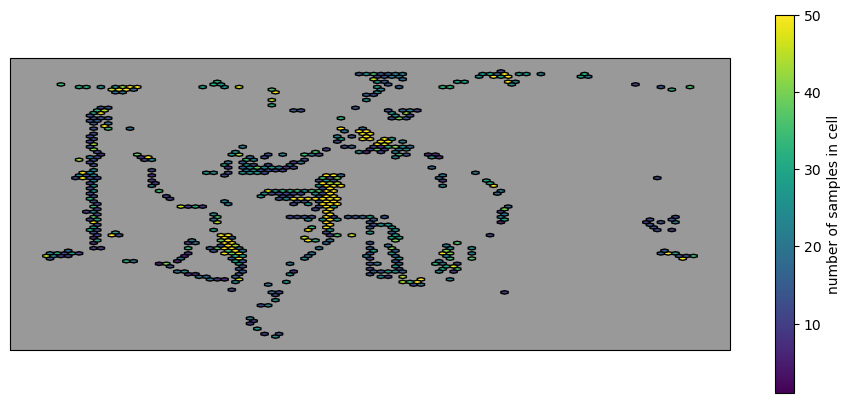

In [15]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd

# Create figure and axis with Mollweide projection
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.Mollweide(central_longitude=300))

# Disable autoscaling to avoid issues with the Mollweide projection


# Add land feature for context
ax.add_feature(cfeature.LAND, facecolor='#999999')

# Convert longitude/latitude to projection coordinates
# Transform the data from PlateCarree (geographic) to Mollweide (projection)
lon, lat = df_1a['longitude'].values, df_1a['latitude'].values

xy = ax.projection.transform_points(ccrs.Mollweide(), lon, lat)  # Transform coordinates
x, y = xy[:, 0], xy[:, 1]  # Extract x and y coordinates

# Create hexbin plot based on the transformed x/y coordinates
hb = ax.hexbin(x, y, gridsize=90, cmap='viridis', edgecolors='k', mincnt=1, vmax=50, vmin=1)

# Add a color bar
cb = fig.colorbar(hb, ax=ax, shrink=0.7, label='number of samples in cell')

# Set the longitudinal extent to cover the full map (Mollweide projection)
#ax.set_extent([0, 360], crs=ccrs.PlateCarree())  # This ensures you see the full map


# Set axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add title
#ax.set_title('Hexbin Plot on Mollweide Projection', fontsize=16)

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
# Show the plot
fig.savefig('/Users/mc4214/GIT/CMIP6_size_spectra/figures/fig_supp_PSSdb_map.png', dpi=300, bbox_inches='tight') 
plt.show()



In [101]:
lon= lon+[-180, 180]

ValueError: operands could not be broadcast together with shapes (21769,) (2,) 

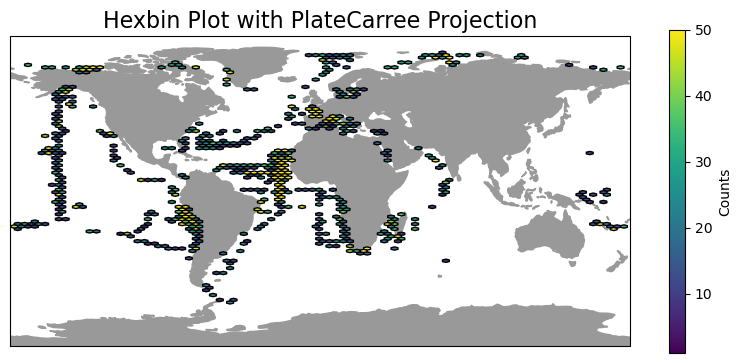

In [57]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd


# Create figure and axis with PlateCarree projection
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())  # Use PlateCarree projection

# Disable autoscaling to avoid issues with the projection
ax._autoscaleXon = False
ax._autoscaleYon = False

# Add land feature for context
ax.add_feature(cfeature.LAND, facecolor='#999999')

# Extract the longitude and latitude values
lon, lat = df_1a['longitude'].values, df_1a['latitude'].values

# Create hexbin plot based on the longitude/latitude values
hb = ax.hexbin(lon, lat, gridsize=90, cmap='viridis', edgecolors='k', mincnt=1, vmax=50, vmin=1)

# Add a color bar
cb = fig.colorbar(hb, ax=ax, shrink=0.7, label='Counts')

# Set the extent to cover the full map (PlateCarree projection)
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())  # This ensures you see the full map

# Set axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add title
ax.set_title('Hexbin Plot with PlateCarree Projection', fontsize=16)

# Show the plot
plt.show()


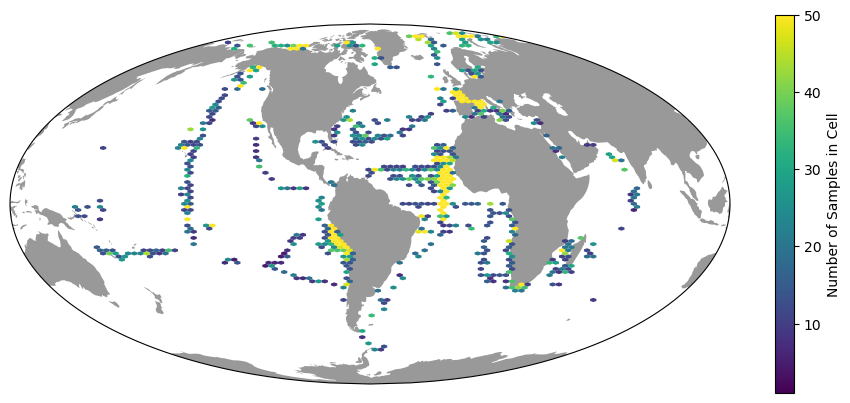

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd

# Example dataframe with latitude and longitude (df_1a
# Create figure and axis with Mollweide projection
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.Mollweide(central_longitude=300))

# Add land feature for context
ax.add_feature(cfeature.LAND, facecolor='#999999')

# Convert longitude/latitude to projection coordinates
lon, lat = df_1a['longitude'].values, df_1a['latitude'].values
xy = ax.projection.transform_points(ccrs.PlateCarree(), lon, lat)  # Transform coordinates
x, y = xy[:, 0], xy[:, 1]  # Extract x and y coordinates

# Create hexbin plot based on the transformed x/y coordinates
hb = ax.hexbin(x, y, gridsize=90, cmap='viridis', edgecolors='none', mincnt=1, vmax=50, vmin=1)

# Add a color bar
cb = fig.colorbar(hb, ax=ax, shrink=0.7, label='Number of Samples in Cell')

# Set the map's extent to cover the full map (Mollweide projection)
# Using ax.set_global() to show the entire globe without clipping
ax.set_global()  # Automatically sets the extent to cover the full globe

# Adjust the figure layout to avoid cropping
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

# Set axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
fig.savefig('/Users/mc4214/GIT/CMIP6_size_spectra/figures/fig_supp_PSSdb_map.png', dpi=300, bbox_inches='tight') 
# Add title
plt.show()